Note $k_o$ here is different from $\tilde{k_o}$

For $f(q,q+1)$, k_o is normal k_o and for m. 

$ f(q,q+1) = m + (1-m)(r_q-r_{q+1}) \pm c k_o $ 

$ \lambda = arccosh(\frac{1 + \tilde{c}^{-1}}{1-\alpha} )$

$ m = \frac{\alpha}{\alpha + \tilde{c}^{-1}} = \frac{1-2k_o}{1-2k_o + c^{-1}}$ 

$r_i =  \frac{sinh((((n+1)/2) - i) \lambda)}{sinh(((n+1)/2)\lambda)  - sinh(((n-1)/2)\lambda) }$




In [ ]:
import numpy as np

k_o = 0.4
c_reg = 1e10
p = 5
q = 3
n = 7
alpha = 1-2*k_o
alpha_prime = k_o

lamb = np.arccosh((1+1/c_reg)/(1-alpha))

def lamb_calc(c_reg,k_o):
    alpha = 1-2*k_o
    return np.arccosh((1+1/c_reg)/(1-alpha))

def sinh(x):
    return np.sinh(x)

def tanh(x):
    return np.tanh(x)

def cosh(x):
    return np.cosh(x)

num = 1 + (
    (sinh(((n + 1) / 2 - q) * lamb) - sinh(((n + 1) / 2 - p) * lamb)) 
    / (sinh(((n + 1) / 2) * lamb) - sinh(((n - 1) / 2) * lamb))
)

denom = ( 1 - 2*alpha_prime 
- (4 * alpha_prime * ( (tanh(lamb / 2)) / sinh(lamb * n) ) * sinh( ((q-p)/2) * lamb) ) 
* (
        (cosh((q - 1 / 2) * lamb) * sinh((n - ((p + q) / 2 - 1 / 2)) * lamb)) +
        (cosh((n - p + 1 / 2) * lamb) * sinh(((p + q) / 2 - 1 / 2) * lamb))
    )
)

c_exp = num/denom

def m(k_o, c_reg):
    m = (1 - 2 * k_o) / (1 - 2 * k_o + (1/c_reg))
    return m

def f_plus(k_o, lamb, n, q, c_reg):
    f = m(k_o,c_reg) + (1-m(k_o,c_reg)) * ( \
        ( ( np.sinh(( ((n+1)/2) - q) * lamb)  - np.sinh(( ((n+1)/2) - (q-1)) * lamb) ) / \
         (np.sinh(((n+1)/2) * lamb) - np.sinh(((n-1)/2) * lamb)) )
    ) + c_exp * k_o
    return f

def f_minus(k_o, lamb, n, q, c_reg):
    f = m(k_o,c_reg) + (1-m(k_o,c_reg)) * ( \
        ( ( np.sinh(( ((n+1)/2) - q) * lamb)  - np.sinh(( (((n+1)/2) - (q+1)) * lamb)) ) / \
         (np.sinh(((n+1)/2) * lamb) - np.sinh(((n-1)/2) * lamb)) )
    ) - c_exp * k_o
    return f

def rank(i):
    num = np.sinh(( ((n+1)/2) - i) * lamb)
    denom = np.sinh(((n+1)/2) * lamb) - np.sinh(((n-1)/2) * lamb)
    return num / denom

print(f_plus(k_o, lamb, n, q, c_reg))
print(f_minus(k_o, lamb, n, q, c_reg))

2.356321838022376
-0.3563218390688875


In [44]:
print(c[1])

3.390804597701149


In [ ]:
D_sim = (
    np.cosh((q - 0.5) * lamb) * np.sinh((n - (p + q) / 2 + 0.5) * lamb)
    + np.cosh((n - p + 0.5) * lamb) * np.sinh(((p + q) / 2 - 0.5) * lamb)
)

num_simplified = 1 + (
    (np.sinh(((n + 1) / 2 - q) * lamb) - np.sinh(((n + 1) / 2 - p) * lamb)) /
    (np.sinh(((n + 1) / 2) * lamb) - np.sinh(((n - 1) / 2) * lamb))
)

denom_simplified = (
    1
    - 2 * alpha_prime
    - 4 * alpha_prime
      * (np.tanh(lamb / 2) / np.sinh(lamb * n))
      * np.sinh(((q - p) / 2) * lamb)
      * D_sim
)

c_simplified = num_simplified / denom_simplified
print(c_simplified)

3.3908045966547764


In [36]:
m(k_o,c_reg)

0.9999999995

In [37]:


rank(q)
rank(q-1)
print(rank(q) - rank(q-1))

-0.2790697673358572


In [38]:
print(c_reg)
lamb_calc(c_reg, k_o=0.4)

10000000000.0


0.693147180726612

In [39]:
f_plus(.49, lamb_calc(c_reg = 1e-6, k_o=0.2), n, q)

TypeError: f_plus() missing 1 required positional argument: 'c_reg'

# Should be plus

# Ultimately while all of the factors are right, I don't have the correct f_plus or f_minus I think.  f_plus and f_minus don't really change

In [ ]:
print( 
        ( ( np.sinh(( ((n+1)/2) - q) * lamb)  - np.sinh(( ((n+1)/2) - (q-1)) * lamb) ) / \
         (np.sinh(((n+1)/2) * lamb) - np.sinh(((n-1)/2) * lamb)) )
    )

-0.2790697673358572


In [ ]:
print(c_exp)
print(lamb)

3.3908045966547764
0.693147180726612


In [ ]:
from Ranking_exp import Ranking_exp
sim = Ranking_exp(n=n, k_o=k_o, k_s=1, k_d=0, p=p, q=q, c_reg=1e10)
sim.calc_rank()
print(sim.a_exp_bar)
print(sim.lamb_val)
print('q,q+1', sim.f_j_k(q,q+1))

D_jq_analytical_sol: 0.12525178536603238
D_jp_analytical_sol: 0.032228529556405504
D_jq_analytical_sol: 0.18787767808036143
D_jp_analytical_sol: 0.04834279434266541
D_jq_analytical_sol: -0.6555575901181593
D_jp_analytical_sol: 0.08862845631234363
D_jq_analytical_sol: 0.17322834646035096
D_jp_analytical_sol: 0.1732283464603509
D_jq_analytical_sol: 0.08862845631234363
D_jp_analytical_sol: -0.6555575901181593
D_jq_analytical_sol: 0.048342794342665404
D_jp_analytical_sol: 0.18787767808036152
D_jq_analytical_sol: 0.032228529556405504
D_jp_analytical_sol: 0.12525178536603238
[2.12643678 2.81609195 5.8045977  5.8045977  2.81609195 2.12643678
 3.3908046 ]
0.693147180726612
q,q+1 0.9999999994195403


In [ ]:
print(c_exp * k_o)


1.3563218386619107


In [ ]:
alpha = 1 - 2 * k_o
print(k_o)
print(np.arccosh((1)/(1-alpha)))
print(lamb)

0.4
0.6931471805599453
0.693147180726612


In [ ]:
from Dual import Dual
sim = Dual(n, k_o=0.4, k_s=1, k_d=0, p=p, q=q, c_var=(1/1e10))
print(sim.lamb_val)
sim.calc_K
print(sim.c_analytical)

0.693147180726612
10000


In [ ]:
import numpy as np

#set local parameters based on class parameters
n = 7
k_o = 0.4
k_s = 1
k_d = 0
p = 5
q = 3
c_var = 0

alpha = 1 - 2 * k_o
alpha_prime = k_o 
lamb_val = np.arccosh((1)/(1-alpha))

K = {}
K_exp = {}
A = {}
arr_len = n-1
dual_len = (n-1) * 2
dual_len_exp = (n-1)*2 + 2
a = np.zeros(dual_len)
a_exp = np.zeros(dual_len_exp)
b = np.zeros(arr_len)
b_bar = np.zeros(arr_len)
c = np.zeros(1)
c_bar = np.zeros(1) 

def check_variables():
    print('n: ', n)
    print('alpha: ', alpha)
    print('k_s: ', k_s)
    print('k_o: ', k_o)
    print('alpha_prime: ', alpha_prime)
    print('c_var', c_var)
    print('lamb_val', lamb_val)
    print('a', a)
    print('a_exp', a_exp)
    print('b', b)
    print('c', c)

def tridiag(n):
    arr_len = n-1
    diag_len = arr_len-1
    B = np.diag(np.ones((diag_len)), k=1) + np.diag(np.ones((diag_len)), k=-1)
    return B        

def k_create(n, alpha_prime):
    arr_len = n-1
    A = np.identity(arr_len)
    D = A
    B = alpha_prime*tridiag(n)
    C = B
    E = np.block([[A,B],[B,A]])
    return E

def y_create(n):
    A = np.ones(n-1)
    B = A * -1
    D = np.concatenate([A, B])
    return D

def a_create(n, alpha_prime):
    K = k_create(n, alpha_prime)
    y = y_create(n)
    a = np.linalg.solve(K, y)
    return a

K = k_create(n,alpha_prime)
# print('K', '\n', K)
# print('det:', np.linalg.det(K))

y = y_create(n)
a = a_create(n, alpha_prime)

#creates a vector for exceptions (only works for exception cases!)
def e_i(n, i):
    len_arr = n-1
    array_pos = i-1     #(-1 to normalize), p and q refer to normal indices (from 1 to len_arr)
    arr = np.zeros(len_arr)
    if i > 0 and i < n: #if outside, k_o excluded from similarity matrix e.g. AE exception for n=5
        arr[array_pos] = 1 
    return arr

#sides matrix in k_exp representing exceptions
def k_exp_horiz(n, p, q, alpha_prime):
    A = e_i(n, p) + e_i(n, q-1)
    B = e_i(n, q) + e_i(n, p-1)
    C = e_i(n, p-1) + e_i(n, q)
    D = e_i(n, q-1) + e_i(n, p)
    E = alpha_prime * np.block([[A,C],[B,D]])
    return E

def k_create_excep(n, p, q, alpha_prime):
    K = k_create(n, alpha_prime)
    E_1 = k_exp_horiz(n, p, q, alpha_prime)
    E_2 = E_1.transpose()
    E_3 = np.identity(2) #2 since there's only 2 columns for exceptions
    
    W = np.concatenate([K, E_1])
    X = np.concatenate([E_2, E_3])
    Z = np.concatenate([W, X], 1)
    return Z

def y_create_exp(n):
    A = np.ones(n-1)
    B = A * -1
    C = np.array([1, -1])
    D = np.concatenate([A, B, C])
    return D

def a_exp_create(n, p, q, alpha_prime):
    K_exp = k_create_excep(n, p, q, alpha_prime)
    y_exp = y_create_exp(n)
    a_exp = np.linalg.solve(K_exp, y_exp)
    return a_exp

K_exp = k_create_excep(n, p, q, alpha_prime)
y_exp = y_create_exp(n)
a_exp = a_exp_create(n, p, q, alpha_prime)

# Create a dictionary with keys generated using the index and values from the array
def create_bc(n,p,q,alpha_prime):
    a_exp = a_exp_create(n,p,q,alpha_prime)
    num_coeff = n-1
    b = {i: a_exp[i-1] for i in range(1, num_coeff + 1)}
    b_bar = {i: a_exp[i-1+n-1] for i in range(1, num_coeff + 1)}
    c = {1: a_exp[2 * num_coeff]}
    c_bar = {1: a_exp[2 * num_coeff + 1]}
    return b, b_bar, c, c_bar

def create_bc_arrays(n,p,q,alpha_prime):
    b, b_bar, c, c_bar = create_bc(n,p,q,alpha_prime)
    b_array = dict_to_array(b)
    b_bar_array = dict_to_array(b_bar)
    c_array = dict_to_array(c)
    c_bar_array = dict_to_array(c_bar)
    return b_array, b_bar_array, c_array, c_bar_array

def get_b(i):
    b, b_bar, c, c_bar = create_bc(n,p,q,alpha_prime)
    if i < 1 or i >= n:
        return 0
    else:
        return b[i]

#turns dictionary to array for testing
def dict_to_array(dict_arr):
    arr = np.zeros(len(dict_arr))
    for i in range(1, len(dict_arr) + 1):
        arr[(i-1)] = dict_arr[i]  
        return arr        

b, b_bar, c, c_bar = create_bc(n,p,q,alpha_prime)
b_array, b_bar_array, c_array, c_bar_array = create_bc_arrays(n,p,q,alpha_prime)

A = tridiag(n)
B = np.linalg.inv(np.identity(n-1) - (A*alpha_prime))

def B_ij_analytical(i, j):
    num = np.cosh((n-(np.abs(j-i))) * lamb_val) - np.cosh((n-i-j)*lamb_val)
    denom = (1-alpha) * np.sinh(lamb_val) * np.sinh(n * lamb_val)
    return num/denom

def B_ij(i,j):
    i_ind = i-1
    j_ind = j-1
    if i < 1 or j < 1 or i > n or j > n:
        return 0
    else: 
        return B[i_ind][j_ind]

#test analytical solutions for b and c
def b_exist(b, i):
    if i>0 and i<n: 
        return b[i]
    else: 
        return 0

def b_mult():
    A = tridiag(n)
    B = np.linalg.inv(np.identity(n-1) - (A*alpha_prime))

    K_mult = np.ones(n-1) - (c[1]*alpha_prime*(e_i(n, p) + e_i(n, q-1) - e_i(n, p-1) - e_i(n, q)))
    b_exp_analytical = B @ K_mult
    return b_exp_analytical

def b_til_dict():
    b_til = B @ np.ones(len(B))
    b_til_dict = {i: b_til[i-1] for i in range(1, arr_len + 1)}
    return b_til_dict

def b_i(i):
    if i < 1 or i > arr_len:
        return 0
    else:
        return b[i]

def K_row(j, k):
    arr_1 = np.zeros(n-1)
    for i in range (0, n-1):
        if j == (i+1) and k == (i+2):
            arr_1[i] = 1
            break
        if j == (i+1):
            arr_1[i] = alpha_prime
        if k == (i+2):
            arr_1[i] = alpha_prime
    arr_2 = np.zeros(n-1)
    for i in range (0, n-1):
        if j == (i+2) and k == (i+1):
            arr_2[i] = 1
            break
        if j == (i+2):
            arr_2[i] = alpha_prime
        if k == (i+1):
            arr_2[i] = alpha_prime
    
    return np.concatenate([arr_1, arr_2])

def K_row_exp(j, k):
    arr_1 = np.zeros(n-1)
    for i in range (0, n-1):
        if j == (i+1) and k == (i+2):
            arr_1[i] = 1
            break
        if j == (i+1):
            arr_1[i] = alpha_prime
        if k == (i+2):
            arr_1[i] = alpha_prime
    arr_2 = np.zeros(n-1)
    for i in range (0, n-1):
        if j == (i+2) and k == (i+1):
            arr_2[i] = 1
            break
        if j == (i+2):
            arr_2[i] = alpha_prime
        if k == (i+1):
            arr_2[i] = alpha_prime
    arr_3 = np.zeros(2)
    if j == p and k == q:
        arr_3[0] = 1
    elif j == q and k == p:
        arr_3[1] = 1 
    elif j == p or k == q:
        arr_3[0] = alpha_prime
    elif j == q or k == p:
        arr_3[1] = alpha_prime
    
    return np.concatenate([arr_1, arr_2, arr_3])

def delta(i,j):
    if i == j:
        return 1
    else:
        return 0

def f_j_k(j,k):
    K_row_exp_cur = K_row_exp(j,k)
    return K_row_exp_cur@a_exp
    
def rank_mult_exp(j):
    rank = alpha_prime * (b_i(j-1) - b_i(j) + c[1] * (delta(j,q) - delta(j,p)))
    return rank

def show_ranks_exp():
    for i in range (1, n):
        print(f'{i}:', rank_mult_exp(i)) 
                
show_ranks_exp()

#returns B_ij
def create_B_ij_exp(i,j):
    num = np.sinh((n-np.max([i,j]))*lamb_val) * np.sinh(np.min([i,j]) * lamb_val)
    denom = np.sinh(lamb_val) * np.sinh(n*lamb_val)
    return num/denom/alpha_prime

def B_ij(i,j):
    if i > 0 and i <= n and j > 0 and j <= n:
        return create_B_ij_exp(i,j)
    else:
        return 0
    
def create_D_ij_exp(i, j):
    return alpha_prime * ( create_B_ij_exp(i-1, j) 
                        + create_B_ij_exp(i, j-1) 
                        - create_B_ij_exp(i, j) 
                        - create_B_ij_exp(i-1, j-1))

def D_ij(i,j):
    if i > 0 and i <= n and j > 0 and j <= n:
        return create_D_ij_exp(i,j)
    else:
        return 0

def create_D_ij_matrix():
    arr = np.zeros((n,n))
    for i_ind in range (0, n):
        i = i_ind + 1
        for j_ind in range (0, n):
            j = j_ind + 1
            arr[i_ind][j_ind] = create_D_ij_exp(i, j)
    return arr

#i <= j-1
def D_ij_analytical_case_1(i, j):
    l = lamb_val
    one = np.sinh((n-j)*l)
    two = np.sinh(i*l)
    three = np.sinh((i-1)*l)
    four = np.sinh((n-(j-1))*l)
    num = (one * three) + (four * two) - (one * two) - (four * three)
    denom = np.sinh(lamb_val) * np.sinh(lamb_val * n)
    return num/denom

def D_ij_analytical_case_2(i, j):
    l = lamb_val
    one = np.sinh((n-i)*l)
    two = np.sinh(j*l)
    three = np.sinh((j-1)*l)
    four = np.sinh((n-(i-1))*l)
    num = (one * three) + (four * two) - (one * two) - (four * three)
    denom = np.sinh(lamb_val) * np.sinh(lamb_val * n)
    return num/denom

def create_D_ij_analytical_1_case_3a(i, j):
    l = lamb_val
    one = np.sinh((n - max(i-1,j))*l) * np.sinh(min(i-1,j)*l)
    two = np.sinh((n - max(i,j-1))*l) * np.sinh(min(i,j-1)*l)
    three = np.sinh(((n-max(i,j)))*l) * np.sinh((min(i,j))*l)
    four = np.sinh((n-max(i-1,j-1))*l) * np.sinh(min(i-1,j-1)*l)
    num = one + two - three - four
    denom = np.sinh(lamb_val) * np.sinh(lamb_val * n)
    return num/denom

def D_ij_analytical_case_3b(i, j):
    l = lamb_val
    one = np.sinh((n-j)*l) * np.sinh((i-1)*l)
    two = np.sinh((n-i)*l) * np.sinh((j-1)*l)
    three = np.sinh((n-i)*l) * np.sinh((i)*l)
    four = np.sinh((n-(i-1))*l) * np.sinh((j-1)*l)
    num = one + two - three - four
    denom = np.sinh(lamb_val) * np.sinh(lamb_val * n)
    return num/denom

def D_ij_analytical_sol(i, j):
        if i < j:
            return D_ij_analytical_case_1(i, j)
        elif i > j: 
            return D_ij_analytical_case_2(i, j)
        elif i == j:
            return create_D_ij_analytical_1_case_3a(i, j)

#nonexception
def rank(i):
    num = np.sinh(( ((n+1)/2) - i) * lamb_val)
    denom = np.sinh(((n+1)/2) * lamb_val) - np.sinh(((n-1)/2) * lamb_val)
    return num / denom

def rank_til(i):
    return -rank(i)

def rank_mult_exp_2(j):
    rank_mult_exp_2 = rank_til(j) + ( c[1] * 
                                    alpha_prime * (D_ij(j,q) - D_ij(j,p) + delta(j,q) - delta(j,p)) )
    return rank_mult_exp_2

def c_double_til():
    num = 1 + rank_til(p) - rank_til(q)
    denom = 1 - (alpha_prime * (D_ij_analytical_sol(p,q) - D_ij_analytical_sol(p,p) - D_ij_analytical_sol(q,q) + D_ij_analytical_sol(q,p)) ) 
    c_analytical = num/denom
    return c_analytical

def c_analytical_form():
    c_analytical = c_double_til()
    return c_analytical

def rank_mult_exp_analytical(j):
    rank = rank_til(j) + c_analytical_form() * alpha_prime * (D_ij_analytical_sol(j, q) - D_ij_analytical_sol(j, p) + delta(j,q) - delta(j,p))
    return rank

assert np.isclose(c_analytical_form(), c[1])
assert np.isclose(c_exp, c[1])
assert np.isclose(sim.f_j_k(q,q+1), )
c_analytical = c_double_til()
print(c_analytical)

1: -0.8505747126436782
2: -0.27586206896551746
3: 0.16091954022988464
4: 3.552713678800501e-16
5: -0.16091954022988536
6: 0.2758620689655178


AttributeError: 'Dual' object has no attribute 'f_j_k'

In [ ]:
type(c)

dict

In [ ]:
print(c[1] * k_o)

1.3563218390804597


In [40]:
print(f_minus(k_o, lamb, n, q, c_reg))
print(f_plus(k_o, lamb, n, q, c_reg))    

from Ranking_exp import Ranking_exp
sim = Ranking_exp(n=n, k_o=k_o, k_s=1, k_d=0, p=p, q=q, c_reg=1e10)
sim.calc_rank()
print(sim.a_exp_bar)
print(sim.lamb_val)
print('q,q+1', sim.f_j_k(q,q+1))

print()

-0.3563218390688875
2.356321838022376
D_jq_analytical_sol: 0.12525178536603238
D_jp_analytical_sol: 0.032228529556405504
D_jq_analytical_sol: 0.18787767808036143
D_jp_analytical_sol: 0.04834279434266541
D_jq_analytical_sol: -0.6555575901181593
D_jp_analytical_sol: 0.08862845631234363
D_jq_analytical_sol: 0.17322834646035096
D_jp_analytical_sol: 0.1732283464603509
D_jq_analytical_sol: 0.08862845631234363
D_jp_analytical_sol: -0.6555575901181593
D_jq_analytical_sol: 0.048342794342665404
D_jp_analytical_sol: 0.18787767808036152
D_jq_analytical_sol: 0.032228529556405504
D_jp_analytical_sol: 0.12525178536603238
[2.12643678 2.81609195 5.8045977  5.8045977  2.81609195 2.12643678
 3.3908046 ]
0.693147180726612
q,q+1 0.9999999994195403



# We know that c is correct in its original form but doesn't seem correct in the extended version 

D_jp_til_part_val: 9.037037040120373
D_jq_til_part_val: 81.00411527442904
D_jp_til_part_val: 21.086419763293218
D_jq_til_part_val: 189.0096023340025
D_jp_til_part_val: 61.251028844552486
D_jq_til_part_val: 549.0278925685824
D_jp_til_part_val: 183.08367640563213
D_jq_til_part_val: 183.08367640563213
D_jp_til_part_val: 549.0278925685824
D_jq_til_part_val: 61.251028844552486
D_jp_til_part_val: 189.0096023340025
D_jq_til_part_val: 21.086419763293218
D_jp_til_part_val: 81.00411527442904
D_jq_til_part_val: 9.037037040120373
D_jp_til_part_val: 8.539743417582025
D_jq_til_part_val: 73.40136153121433
D_jp_til_part_val: 19.459415331388463
D_jq_til_part_val: 167.25884023453804
D_jp_til_part_val: 55.26161833105538
D_jq_til_part_val: 474.98827863686415
D_jp_til_part_val: 161.72621855904282
D_jq_til_part_val: 161.72621855904282
D_jp_til_part_val: 474.98827863686415
D_jq_til_part_val: 55.26161833105538
D_jp_til_part_val: 167.25884023453804
D_jq_til_part_val: 19.459415331388463
D_jp_til_part_val: 73.40

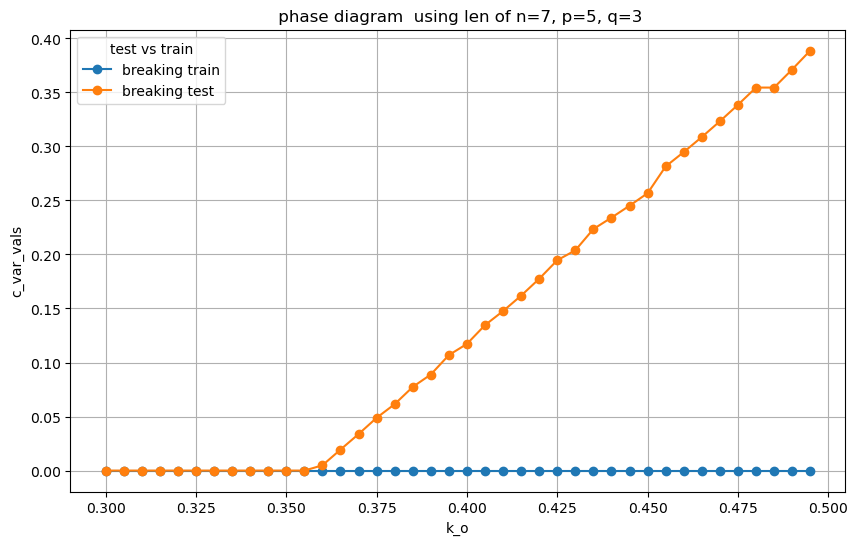

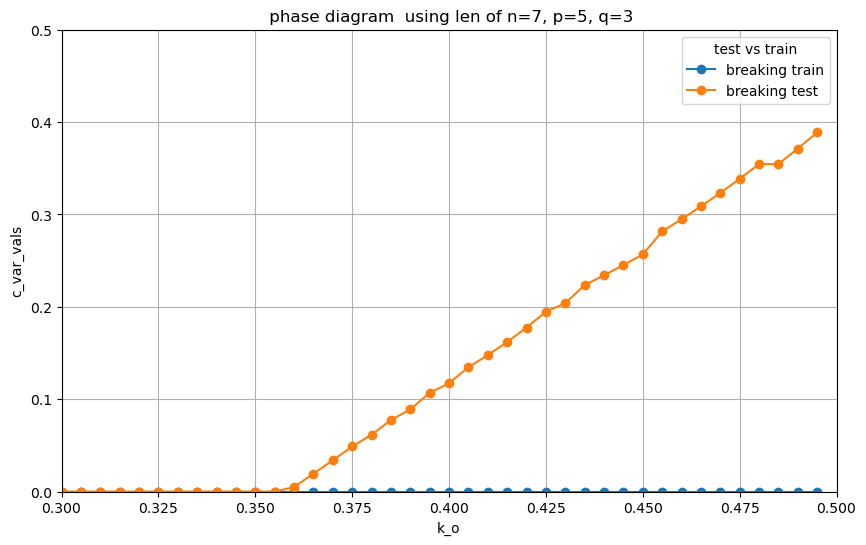

In [ ]:
from Ranking_exp import Ranking_exp
import numpy as np
import matplotlib.pyplot as plt
import math

# Set initial parameters
n = 7  # fix n
p = 5
q = 3
k_o_vals = np.arange(.3, 0.499, 0.005)
k_s = 1
k_d = 0
delta_s = k_s - k_d 
excep_len = 3 
c_var_vals = np.logspace(-10,10,1000)
c_vals = 1/(c_var_vals * delta_s)

test_critical_pair = [q-1, p]
train_critical_pair = [q, q+1]

margin_list_array = []

breaking_reg_test = []
breaking_reg_train = []
for k_o in k_o_vals:
    
    test_flag = False
    for i in range(len(c_vals)):
        sim = Ranking_exp(n=n, k_o=k_o, k_s=k_s, k_d=k_d, p=p, q=q, c_reg=c_vals[i])
        ranks = sim.calc_rank_analytic()
        margin_test = sim.f_j_k(test_critical_pair[0],test_critical_pair[1])
        if margin_test<0:
            breaking_reg_test.append(c_var_vals[i])
            # print('test:')
            # print(f'for k_o = {k_o}, i = {i}, c_var_val = {c_var_vals[i]}')
            # print(f'break, c_var_val = {c_var_vals[i]}, k_o = {k_o}')
            test_flag = True
            break
    if test_flag == False:
        breaking_reg_test.append(0)

    train_flag = False
    for i in range(len(c_vals)):
        k_o = k_o
        lamb = lamb = np.arccosh(1 + 1/(c_vals[i]))/(1-k_o)
        margin_train = f_plus(k_o, lamb, n, q)
        # print(margin_train)
        if margin_train<0:
            breaking_reg_train.append(c_var_vals[i])
            # print('train:')
            # print(f'for k_o = {k_o}, i = {i}, c_var_val = {c_var_vals[i]}')
            # print(f'break, c_var_val = {c_var_vals[i]}, k_o = {k_o}')
            train_flag = True
            break

    if train_flag == False:
        breaking_reg_train.append(0)


# Plot results

plt.figure(figsize=(10, 6))
plt.title(f' phase diagram  using len of n={n}, p={p}, q={q}')
plt.plot(k_o_vals, breaking_reg_train, marker='o', label=f'breaking train')
plt.plot(k_o_vals, breaking_reg_test, marker='o', label=f'breaking test')
plt.legend(title="test vs train")
plt.xlabel('k_o')
plt.ylabel('c_var_vals')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.title(f' phase diagram  using len of n={n}, p={p}, q={q}')
plt.plot(k_o_vals, breaking_reg_train, marker='o', label=f'breaking train')
plt.plot(k_o_vals, breaking_reg_test, marker='o', label=f'breaking test')
plt.legend(title="test vs train")
plt.xlabel('k_o')
plt.ylabel('c_var_vals')
plt.grid(True)
plt.ylim(0, 0.5)
plt.xlim(0.30,0.5)
plt.show()


D_jp_til_part_val: 9.037037040120373
D_jq_til_part_val: 81.00411527442904
D_jp_til_part_val: 21.086419763293218
D_jq_til_part_val: 189.0096023340025
D_jp_til_part_val: 61.251028844552486
D_jq_til_part_val: 549.0278925685824
D_jp_til_part_val: 183.08367640563213
D_jq_til_part_val: 183.08367640563213
D_jp_til_part_val: 549.0278925685824
D_jq_til_part_val: 61.251028844552486
D_jp_til_part_val: 189.0096023340025
D_jq_til_part_val: 21.086419763293218
D_jp_til_part_val: 81.00411527442904
D_jq_til_part_val: 9.037037040120373
D_jp_til_part_val: 8.539743417582025
D_jq_til_part_val: 73.40136153121433
D_jp_til_part_val: 19.459415331388463
D_jq_til_part_val: 167.25884023453804
D_jp_til_part_val: 55.26161833105538
D_jq_til_part_val: 474.98827863686415
D_jp_til_part_val: 161.72621855904282
D_jq_til_part_val: 161.72621855904282
D_jp_til_part_val: 474.98827863686415
D_jq_til_part_val: 55.26161833105538
D_jp_til_part_val: 167.25884023453804
D_jq_til_part_val: 19.459415331388463
D_jp_til_part_val: 73.40

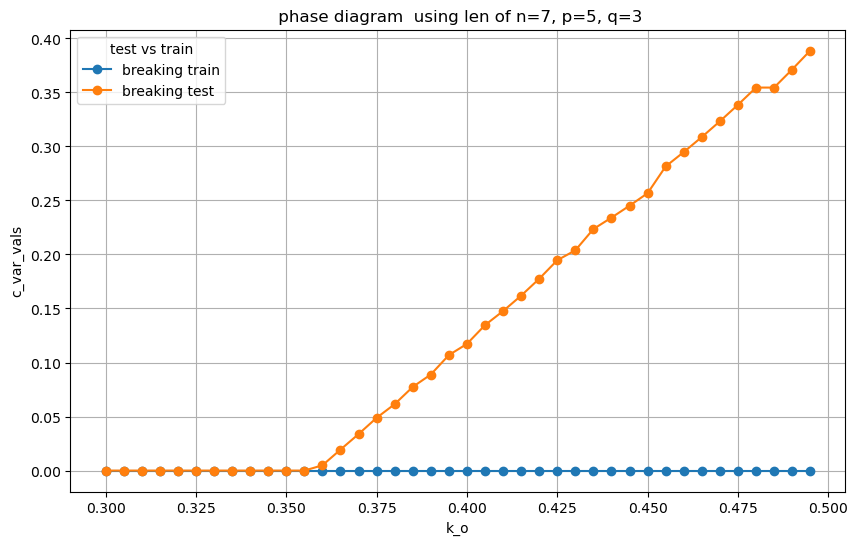

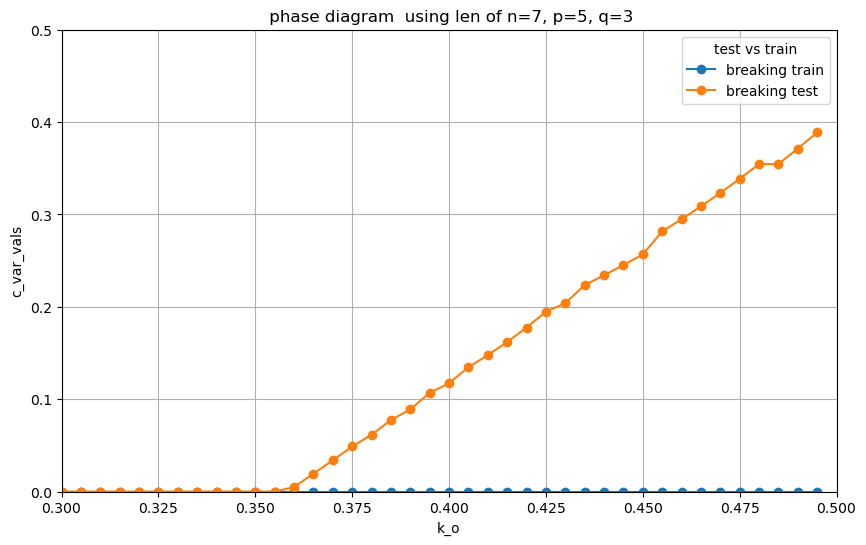

In [ ]:
from Ranking_exp import Ranking_exp
import numpy as np
import matplotlib.pyplot as plt
import math

# Set initial parameters
n = 7  # fix n
p = 5
q = 3
k_o_vals = np.arange(.3, 0.499, 0.005)
k_s = 1
k_d = 0
delta_s = k_s - k_d 
excep_len = 3 
c_var_vals = np.logspace(-10,10,1000)
c_vals = 1/(c_var_vals * delta_s)

test_critical_pair = [q-1, p]
train_critical_pair = [q, q+1]

margin_list_array = []

breaking_reg_test = []
breaking_reg_train = []
for k_o in k_o_vals:
    
    test_flag = False
    for i in range(len(c_vals)):
        sim = Ranking_exp(n=n, k_o=k_o, k_s=k_s, k_d=k_d, p=p, q=q, c_reg=c_vals[i])
        ranks = sim.calc_rank_analytic()
        margin_test = sim.f_j_k(test_critical_pair[0],test_critical_pair[1])
        if margin_test<0:
            breaking_reg_test.append(c_var_vals[i])
            # print('test:')
            # print(f'for k_o = {k_o}, i = {i}, c_var_val = {c_var_vals[i]}')
            # print(f'break, c_var_val = {c_var_vals[i]}, k_o = {k_o}')
            test_flag = True
            break
    if test_flag == False:
        breaking_reg_test.append(0)

    break_tracker = 0
    train_flag = False
    for i in range(len(c_vals)):
        k_o = k_o
        lamb = lamb = np.arccosh(1 + 1/(c_vals[i]))/(1-k_o)
        margin_train = f_minus(k_o, lamb, n, q)
        # print(margin_train)
        if margin_train<0:
            breaking_reg_train.append(c_var_vals[i])
            # print('train:')
            # print(f'for k_o = {k_o}, i = {i}, c_var_val = {c_var_vals[i]}')
            # print(f'break, c_var_val = {c_var_vals[i]}, k_o = {k_o}')
            train_flag = True
            break

    if train_flag == False:
        breaking_reg_train.append(0)
        break_tracker += 1

print(break_tracker)

# Plot results

plt.figure(figsize=(10, 6))
plt.title(f' phase diagram  using len of n={n}, p={p}, q={q}')
plt.plot(k_o_vals, breaking_reg_train, marker='o', label=f'breaking train')
plt.plot(k_o_vals, breaking_reg_test, marker='o', label=f'breaking test')
plt.legend(title="test vs train")
plt.xlabel('k_o')
plt.ylabel('c_var_vals')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.title(f' phase diagram  using len of n={n}, p={p}, q={q}')
plt.plot(k_o_vals, breaking_reg_train, marker='o', label=f'breaking train')
plt.plot(k_o_vals, breaking_reg_test, marker='o', label=f'breaking test')
plt.legend(title="test vs train")
plt.xlabel('k_o')
plt.ylabel('c_var_vals')
plt.grid(True)
plt.ylim(0, 0.5)
plt.xlim(0.30,0.5)
plt.show()
